In [1]:
import os
os.chdir(r'C:\Users\66959\Desktop\stats\data')
os.getcwd()

'C:\\Users\\66959\\Desktop\\stats\\data'

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
orig_df1 = pd.read_csv('worldbank_2017_2021.csv')
orig_df2 = pd.read_excel('countries_regions.xlsx')

In [4]:
orig_df1.head()

,Country Name,Year,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),"Agriculture, forestry, and fishing, value added (% of GDP)",Arable land (% of land area),Cereal yield (kg per hectare),Crop production index (2014-2016 = 100),Fertilizer consumption (kilograms per hectare of arable land),Food production index (2014-2016 = 100),...,Merchandise exports (current US$),Merchandise imports (current US$),Merchandise trade (% of GDP),"Contributing family workers, female (% of female employment) (modeled ILO estimate)","Contributing family workers, male (% of male employment) (modeled ILO estimate)",Firms with female participation in ownership (% of firms),Firms with female top manager (% of firms),"Proportion of time spent on unpaid domestic and care work, female (% of 24 hour day)","Proportion of time spent on unpaid domestic and care work, male (% of 24 hour day)","Women making their own informed decisions regarding sexual relations, contraceptive use and reproductive health care (% of women age 15-49)"
0,Afghanistan,2017,5.99,58.12,26.42,11.80,2091.4,99.21,20.45,99.84,...,7.230000e+08,7.065000e+09,41.53,62.58,12.20,NaN,NaN,NaN,NaN,NaN
1,Albania,2017,14.56,42.86,19.02,22.34,4813.0,105.84,99.81,103.88,...,2.292000e+09,5.271000e+09,58.09,29.97,17.04,NaN,NaN,NaN,NaN,NaN
2,Algeria,2017,3.16,17.36,11.03,3.14,990.3,104.40,20.84,102.87,...,3.519100e+10,4.605900e+10,42.79,2.33,1.70,NaN,NaN,NaN,NaN,NaN
3,American Samoa,2017,NaN,13.90,NaN,4.65,NaN,NaN,41.67,NaN,...,3.970000e+08,5.950000e+08,162.09,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Andorra,2017,NaN,40.04,0.56,1.74,NaN,NaN,NaN,NaN,...,1.180000e+08,1.478000e+09,53.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
orig_df2.head()

,CountryName,Region,ThirdWorld
0,Afghanistan,South Asia,Yes
1,Albania,Eastern Europe,No
2,Algeria,Africa,No
3,American Samoa,Australia and Oceanea,No
4,Andorra,Western Europe,No


In [6]:
orig_df1.shape

(1080, 195)

In [7]:
orig_df2.shape

(217, 3)

In [8]:
orig_df = pd.merge(orig_df1, orig_df2, left_on='Country Name', right_on='CountryName')

In [9]:
orig_df.head()

,Country Name,Year,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),"Agriculture, forestry, and fishing, value added (% of GDP)",Arable land (% of land area),Cereal yield (kg per hectare),Crop production index (2014-2016 = 100),Fertilizer consumption (kilograms per hectare of arable land),Food production index (2014-2016 = 100),...,"Contributing family workers, female (% of female employment) (modeled ILO estimate)","Contributing family workers, male (% of male employment) (modeled ILO estimate)",Firms with female participation in ownership (% of firms),Firms with female top manager (% of firms),"Proportion of time spent on unpaid domestic and care work, female (% of 24 hour day)","Proportion of time spent on unpaid domestic and care work, male (% of 24 hour day)","Women making their own informed decisions regarding sexual relations, contraceptive use and reproductive health care (% of women age 15-49)",CountryName,Region,ThirdWorld
0,Afghanistan,2017,5.99,58.12,26.42,11.80,2091.4,99.21,20.45,99.84,...,62.58,12.20,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Yes
1,Albania,2017,14.56,42.86,19.02,22.34,4813.0,105.84,99.81,103.88,...,29.97,17.04,NaN,NaN,NaN,NaN,NaN,Albania,Eastern Europe,No
2,Algeria,2017,3.16,17.36,11.03,3.14,990.3,104.40,20.84,102.87,...,2.33,1.70,NaN,NaN,NaN,NaN,NaN,Algeria,Africa,No
3,American Samoa,2017,NaN,13.90,NaN,4.65,NaN,NaN,41.67,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,American Samoa,Australia and Oceanea,No
4,Andorra,2017,NaN,40.04,0.56,1.74,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Andorra,Western Europe,No


In [10]:
orig_df.shape

(1070, 198)

In [11]:
df = orig_df.copy()

In [12]:
df.duplicated().any()

np.False_

In [13]:
df = df.drop(columns=['CountryName'])

# Data types

In [14]:
print(df.dtypes.to_string())

Country Name                                                                                                                                    object
Year                                                                                                                                             int64
Agricultural irrigated land (% of total agricultural land)                                                                                     float64
Agricultural land (% of land area)                                                                                                             float64
Agriculture, forestry, and fishing, value added (% of GDP)                                                                                     float64
Arable land (% of land area)                                                                                                                   float64
Cereal yield (kg per hectare)                                                                 

In [15]:
cat_cols = ['Country Name', 'Region', 'ThirdWorld']
num_cols = df.drop(columns=['Country Name', 'Region', 'ThirdWorld']).columns

# Missing values

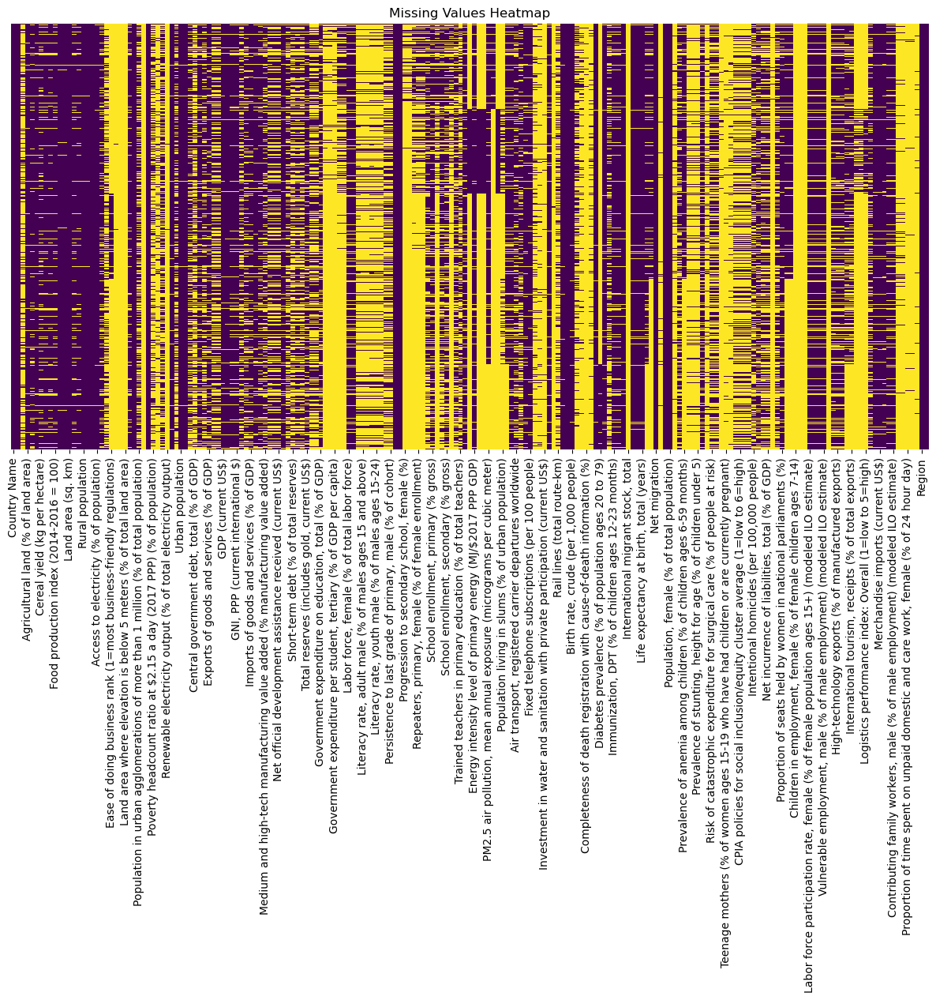

In [16]:
plt.figure(figsize=(15, 7))
sns.heatmap(df.isna(), yticklabels=False, cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

In [17]:
print((df.isna().mean() * 100).to_string())

Country Name                                                                                                                                     0.000000
Year                                                                                                                                             0.000000
Agricultural irrigated land (% of total agricultural land)                                                                                      76.728972
Agricultural land (% of land area)                                                                                                               3.271028
Agriculture, forestry, and fishing, value added (% of GDP)                                                                                      10.186916
Arable land (% of land area)                                                                                                                     4.672897
Cereal yield (kg per hectare)                                               

# Distributions

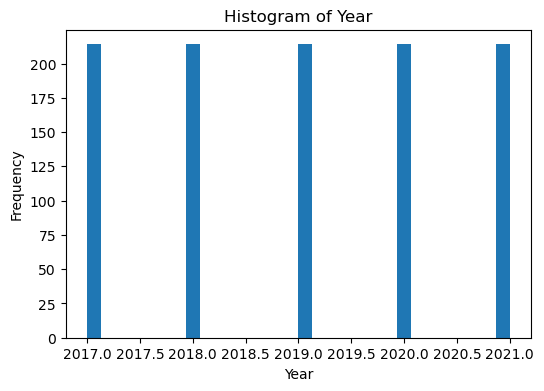

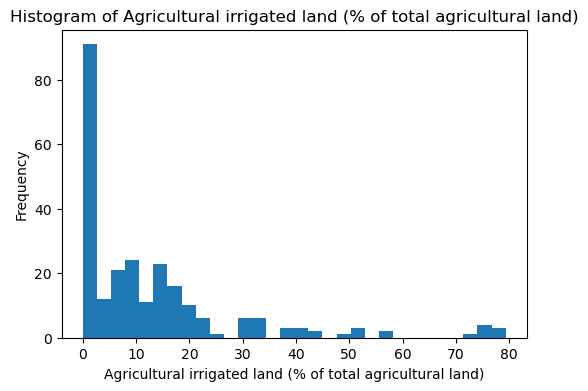

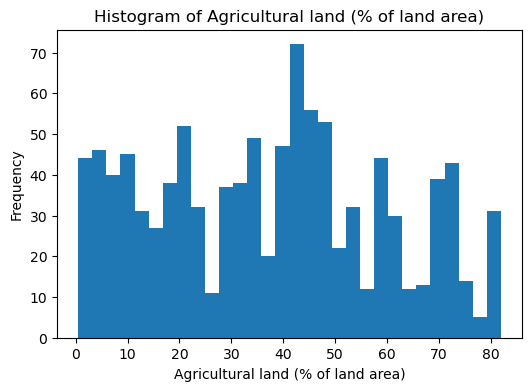

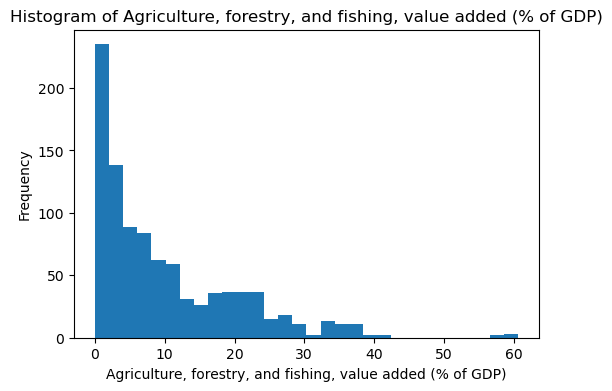

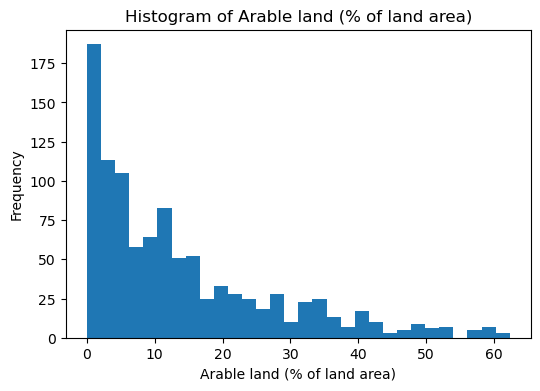

...

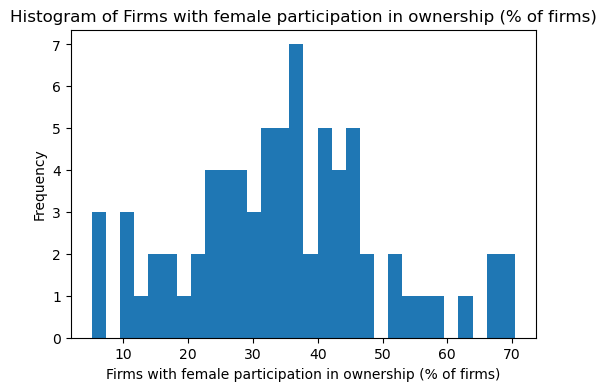

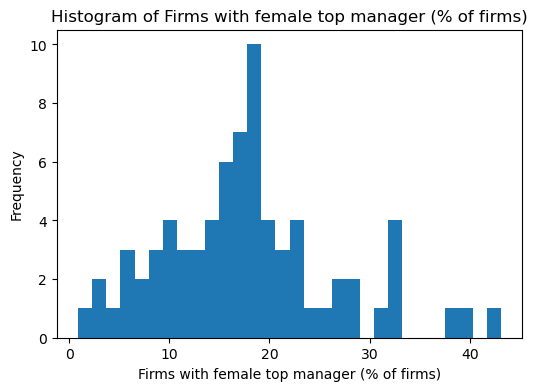

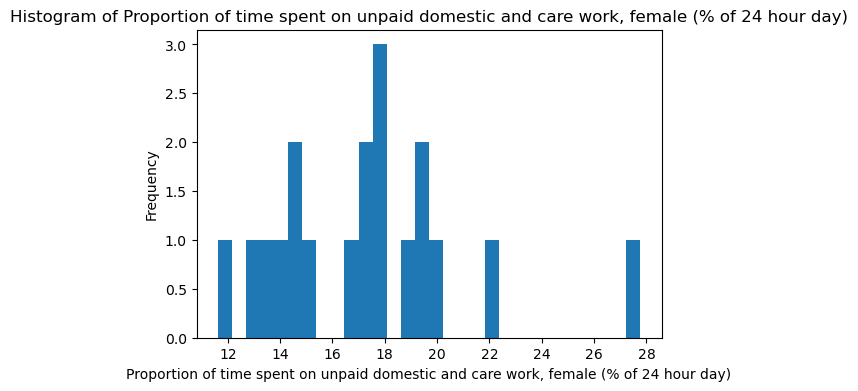

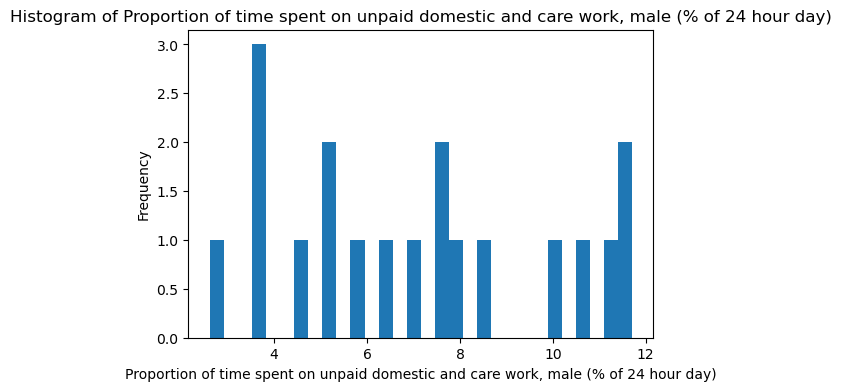

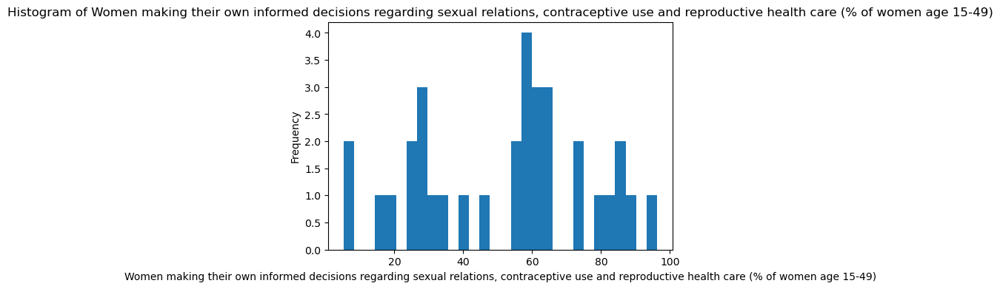

In [18]:
for col in num_cols:
    plt.figure(figsize=(6, 4))
    plt.hist(df[col].dropna(), bins=30)
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

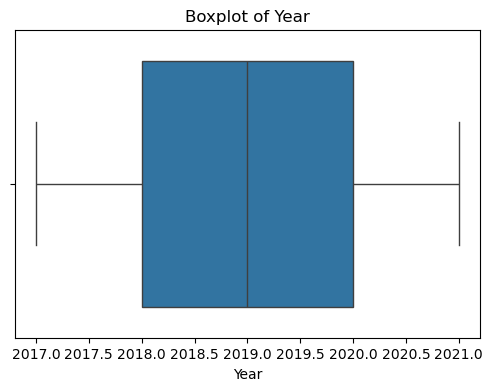

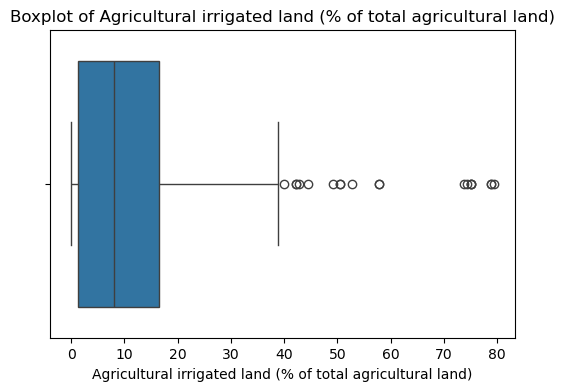

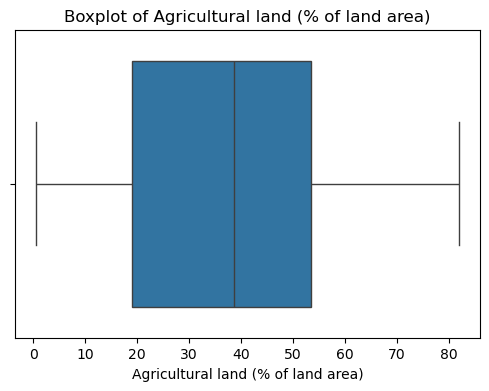

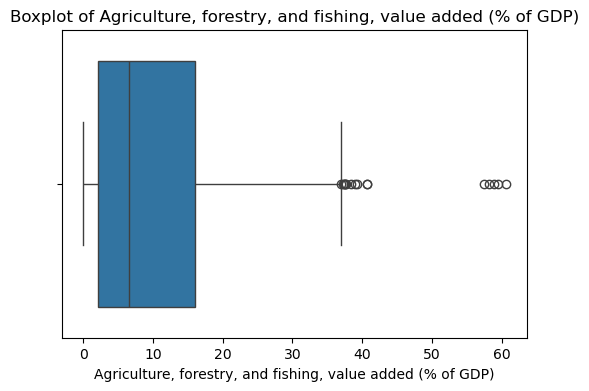

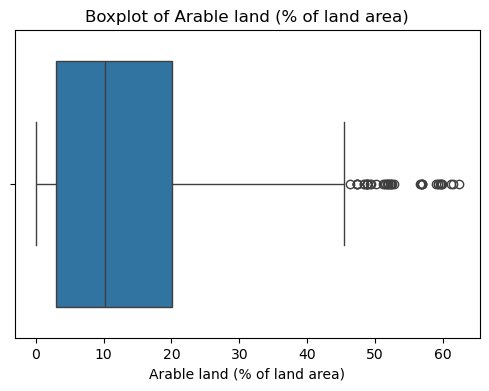

...

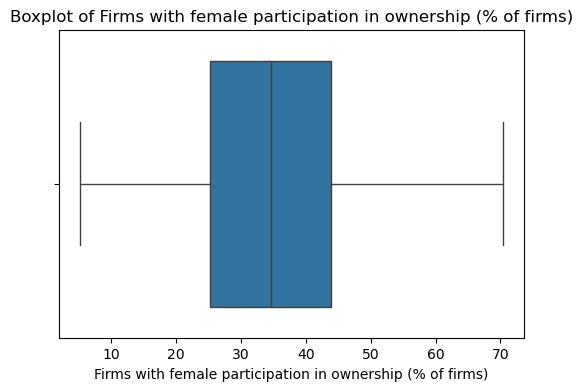

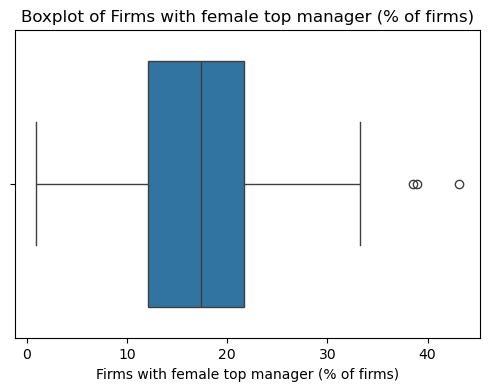

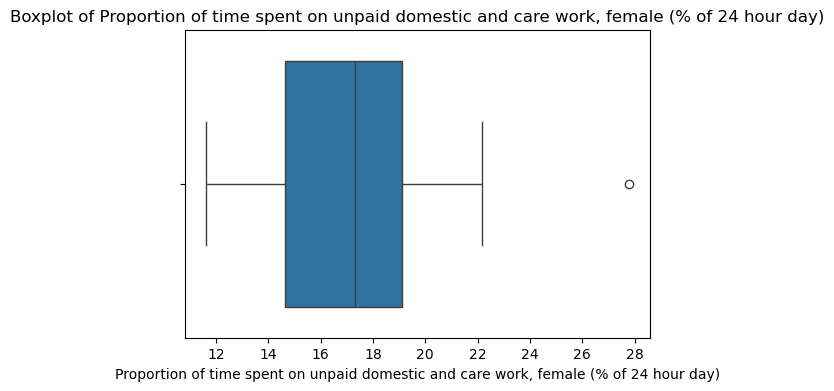

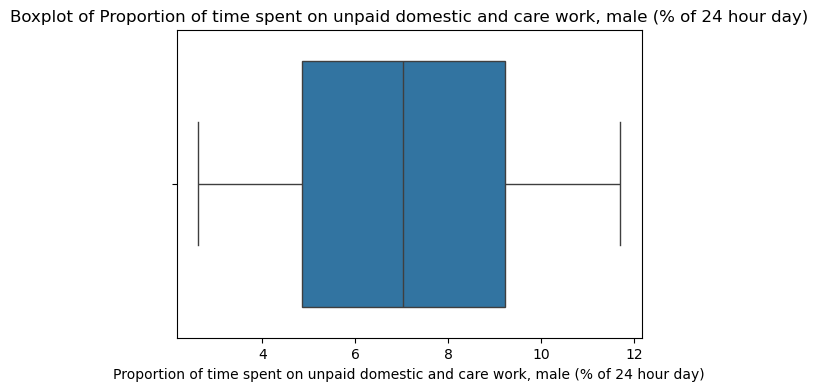

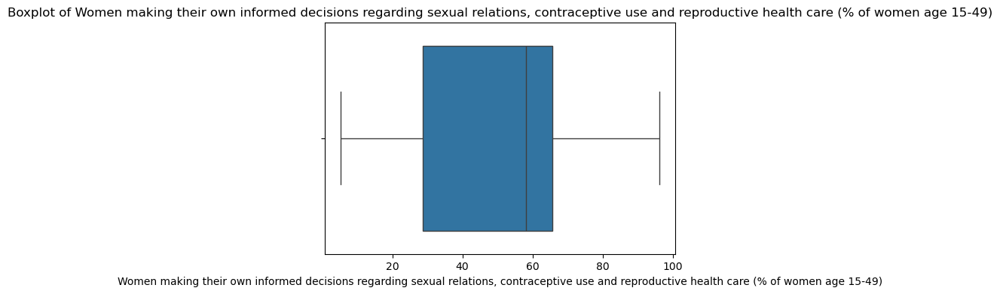

In [19]:
for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[col].dropna())
    plt.title(f"Boxplot of {col}")
    plt.xlabel(col)
    plt.show()

In [20]:
print((df[num_cols].skew()).to_string())

Year                                                                                                                                            0.000000
Agricultural irrigated land (% of total agricultural land)                                                                                      2.198001
Agricultural land (% of land area)                                                                                                              0.127895
Agriculture, forestry, and fishing, value added (% of GDP)                                                                                      1.480385
Arable land (% of land area)                                                                                                                    1.306782
Cereal yield (kg per hectare)                                                                                                                   4.031732
Crop production index (2014-2016 = 100)                                           

In [21]:
print((df[num_cols].kurtosis()).to_string())

Year                                                                                                                                            -1.300467
Agricultural irrigated land (% of total agricultural land)                                                                                       5.123512
Agricultural land (% of land area)                                                                                                              -0.992075
Agriculture, forestry, and fishing, value added (% of GDP)                                                                                       2.561099
Arable land (% of land area)                                                                                                                     1.155908
Cereal yield (kg per hectare)                                                                                                                   24.615703
Crop production index (2014-2016 = 100)                                     

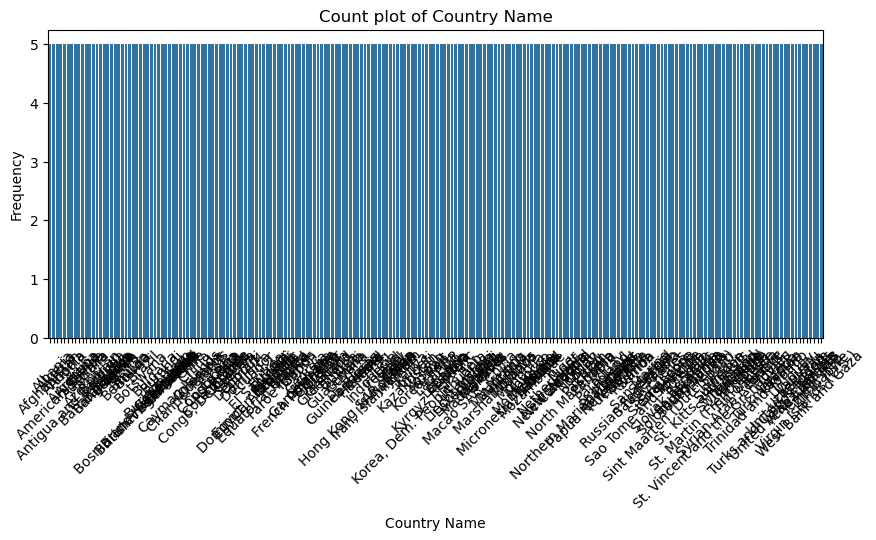

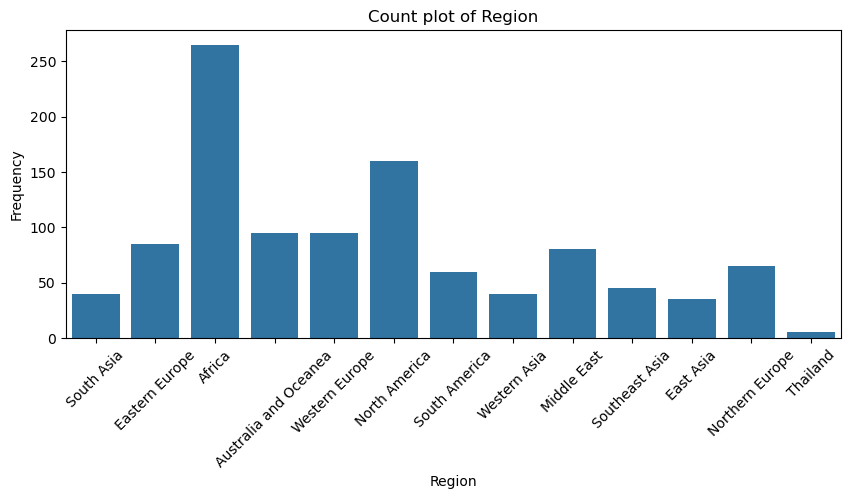

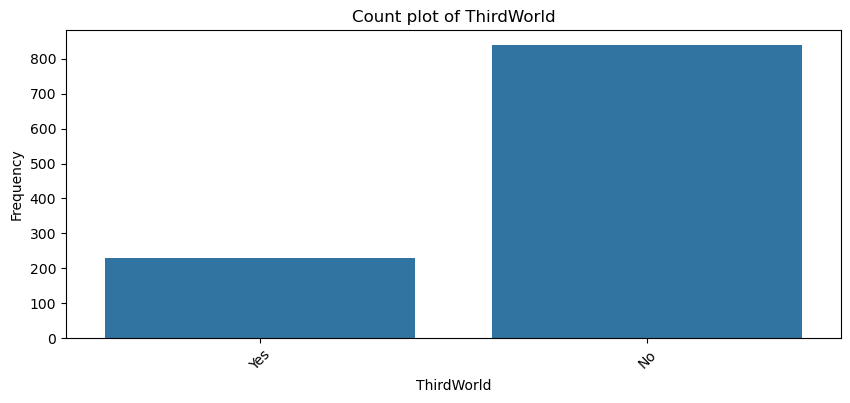

In [22]:
for col in cat_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(x=df[col])
    plt.title(f"Count plot of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.xticks(rotation=45)
    plt.show()

In [23]:
for col in cat_cols:
    print(df[col].value_counts()/len(df) * 100)

Country Name
Afghanistan    0.46729
Myanmar        0.46729
Nauru          0.46729
Nepal          0.46729
Netherlands    0.46729
                ...   
Gibraltar      0.46729
Greece         0.46729
Greenland      0.46729
Grenada        0.46729
Zimbabwe       0.46729
Name: count, Length: 214, dtype: float64
Region
Africa                   24.766355
North America            14.953271
Australia and Oceanea     8.878505
Western Europe            8.878505
Eastern Europe            7.943925
Middle East               7.476636
Northern Europe           6.074766
South America             5.607477
Southeast Asia            4.205607
South Asia                3.738318
Western Asia              3.738318
East Asia                 3.271028
Thailand                  0.467290
Name: count, dtype: float64
ThirdWorld
No     78.504673
Yes    21.495327
Name: count, dtype: float64


# Average and Standard deviation

In [24]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

df[num_cols].describe()

,Year,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),"Agriculture, forestry, and fishing, value added (% of GDP)",Arable land (% of land area),Cereal yield (kg per hectare),Crop production index (2014-2016 = 100),Fertilizer consumption (kilograms per hectare of arable land),Food production index (2014-2016 = 100),Forest area (% of land area),Forest area (sq. km),Land area (sq. km),Livestock production index (2014-2016 = 100),Permanent cropland (% of land area),Rural population,Rural population (% of total population),Surface area (sq. km),Access to electricity (% of population),"Annual freshwater withdrawals, total (% of internal resources)",CPIA public sector management and institutions cluster average (1=low to 6=high),Ease of doing business rank (1=most business-friendly regulations),Electric power consumption (kWh per capita),Energy use (kg of oil equivalent per capita),Land area where elevation is below 5 meters (% of total land area),"Mortality rate, under-5 (per 1,000 live births)",Population growth (annual %),Population in urban agglomerations of more than 1 million (% of total population),Population living in areas where elevation is below 5 meters (% of total population),"Population, total",Poverty headcount ratio at $2.15 a day (2017 PPP) (% of population),"Prevalence of underweight, weight for age (% of children under 5)","Primary completion rate, total (% of relevant age group)",Renewable electricity output (% of total electricity output),Renewable energy consumption (% of total final energy consumption),"School enrollment, primary and secondary (gross), gender parity index (GPI)",Urban population,Urban population (% of total population),"Adjusted net savings, including particulate emission damage (% of GNI)","Central government debt, total (% of GDP)","Current account balance (BoP, current US$)",Expense (% of GDP),Exports of goods and services (% of GDP),External debt stocks (% of GNI),"External debt stocks, total (DOD, current US$)",GDP (current US$),GDP growth (annual %),"GNI per capita, PPP (current international $)","GNI, PPP (current international $)","Grants, excluding technical cooperation (BoP, current US$)",Gross savings (% of GDP),Imports of goods and services (% of GDP),"Industry (including construction), value added (% of GDP)","Inflation, consumer prices (annual %)",Medium and high-tech manufacturing value added (% manufacturing value added),Net ODA received (% of GNI),Net ODA received per capita (current US$),Net official development assistance received (current US$),Price level ratio of PPP conversion factor (GDP) to market exchange rate,"Revenue, excluding grants (% of GDP)",Short-term debt (% of total reserves),"Technical cooperation grants (BoP, current US$)","Total debt service (% of exports of goods, services and primary income)","Total reserves (includes gold, current US$)","Children out of school, primary, female","Children out of school, primary, male","Government expenditure on education, total (% of GDP)","Government expenditure per student, primary (% of GDP per capita)","Government expenditure per student, secondary (% of GDP per capita)","Government expenditure per student, tertiary (% of GDP per capita)","Gross intake ratio in first grade of primary education, female (% of relevant age group)","Gross intake ratio in first grade of primary education, male (% of relevant age group)","Labor force, female (% of total labor force)","Labor force, total","Literacy rate, adult female (% of females ages 15 and above)","Literacy rate, adult male (% of males ages 15 and above)","Literacy rate, adult total (% of people ages 15 and above)","Literacy rate, youth female (% of females ages 15-24)","Literacy rate, youth male (% of males ages 15-24)","Literacy rate, youth total (% of people ages 15-24)","Persistence to last grade of primary, female (% of cohort)","Persistence to last grade of primary, male (% of cohort)",Population ages 0-14 (% of total po

# Interaction between data

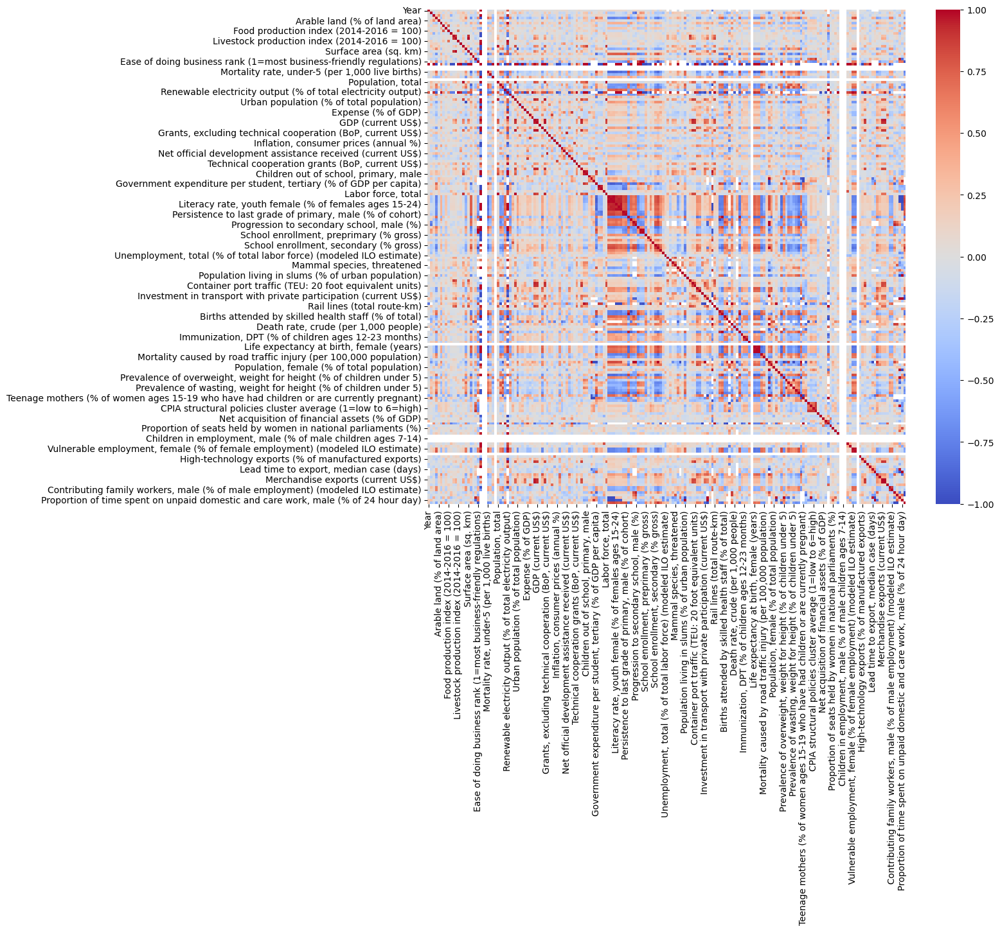

In [25]:
corr = df[num_cols].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr, cmap='coolwarm', center=0)
plt.show()

In [28]:
corr = df[num_cols].corrwith(df['GNI per capita, PPP (current international $)']).sort_values(key=abs, ascending=False)
corr.head(15)

GNI per capita, PPP (current international $)                                    1.000000
Electric power consumption (kWh per capita)                                      0.986008
Renewable electricity output (% of total electricity output)                     0.796519
Logistics performance index: Overall (1=low to 5=high)                           0.791441
Fixed broadband subscriptions (per 100 people)                                   0.760542
Life expectancy at birth, male (years)                                           0.758803
Life expectancy at birth, total (years)                                          0.746486
Vulnerable employment, male (% of male employment) (modeled ILO estimate)       -0.726771
Life expectancy at birth, female (years)                                         0.725066
Vulnerable employment, female (% of female employment) (modeled ILO estimate)   -0.716348
Population ages 0-14 (% of total population)                                    -0.715830
Specialist

In [59]:
from scipy.stats import chi2_contingency

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(k - 1, r - 1))))

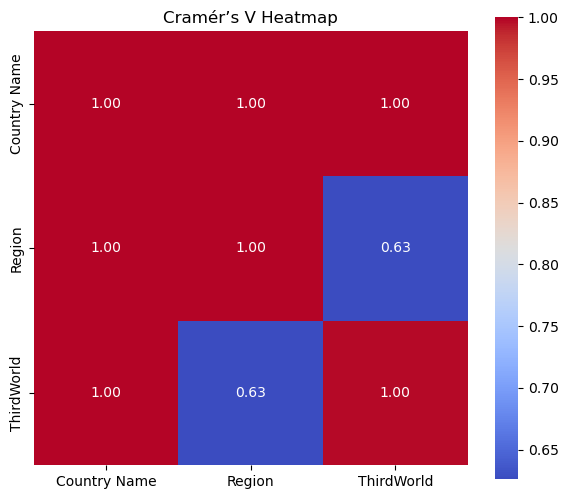

In [61]:
def cramer_matrix(df):
    cols = df.columns
    
    cramer_matrix = pd.DataFrame(index=cols, columns=cols, dtype=float)
    
    for c1 in cols:
        for c2 in cols:
            cramer_matrix.loc[c1, c2] = cramers_v(df[c1], df[c2])
    
    return cramer_matrix

cat_df = df[cat_cols]
cramer_matrix = cramer_matrix(cat_df)

plt.figure(figsize=(7,6))
sns.heatmap(cramer_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Cramér’s V Heatmap")
plt.show()

In [62]:
def conditional_entropy(x, y):
    # Joint distribution P(x, y)
    xy = pd.crosstab(x, y, normalize="all")

    # Marginal distribution P(y)
    py = xy.sum(axis=0)

    # Conditional distribution P(x|y)
    p_x_given_y = xy.div(py, axis=1)

    # H(X|Y) = sum_y P(y) * H(X|Y=y) 
    entropy = -np.nansum(py * (p_x_given_y * np.log2(p_x_given_y)).sum(axis=0))
    return entropy


def entropy(x):
    p = x.value_counts(normalize=True)
    return -np.sum(p * np.log2(p))


def theils_u(x, y):
    h_x = entropy(x)
    h_x_given_y = conditional_entropy(x, y)

    if h_x == 0:
        return 1.0  # X has no uncertainty at all

    return (h_x - h_x_given_y) / h_x

C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(sel

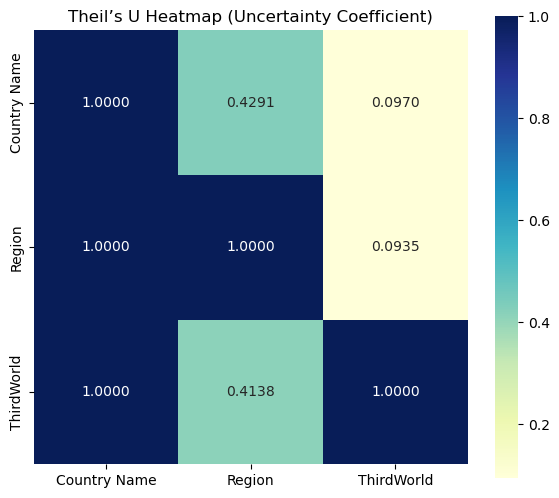

In [64]:
def theils_u_matrix(df):
    cols = df.columns
    matrix = pd.DataFrame(index=cols, columns=cols)
    
    for c1 in cols:
        for c2 in cols:
            matrix.loc[c1, c2] = theils_u(df[c1], df[c2])
    
    return matrix.astype(float)

cat_df = df[cat_cols]
u_matrix = theils_u_matrix(cat_df)
#u_matrix_sorted = u_matrix.sort_values(by=u_matrix.index.tolist(), axis=1)

# Plot heatmap
plt.figure(figsize=(7,6))
#sns.heatmap(u_matrix_sorted, annot=True, cmap="YlGnBu")
sns.heatmap(u_matrix, annot=True, cmap="YlGnBu", fmt=".4f", square=True)
plt.title("Theil’s U Heatmap (Uncertainty Coefficient)")
plt.show()

In [31]:
for col in cat_cols:
    print(df.groupby(col)['GNI per capita, PPP (current international $)'].agg(['mean','median','std','count']))

                          mean   median          std  count
Country Name                                               
Afghanistan             2440.0   2470.0   193.649167      5
Albania                14190.0  14200.0  1216.182552      5
Algeria                13596.0  13620.0   634.097784      5
American Samoa             NaN      NaN          NaN      0
Andorra                61710.0  63180.0  2641.950037      3
...                        ...      ...          ...    ...
Virgin Islands (U.S.)      NaN      NaN          NaN      0
West Bank and Gaza      7112.0   6910.0   356.188153      5
Yemen, Rep.                NaN      NaN          NaN      0
Zambia                  3266.0   3270.0   123.409886      5
Zimbabwe                2666.0   2660.0   380.236768      5

[214 rows x 4 columns]
                               mean   median           std  count
Region                                                           
Africa                  6147.450980   3420.0   6118.014140    25